In [25]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing
import tensorflow as tf

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

from matplotlib import pyplot as plt

from tqdm import tqdm
from PIL import Image as Img
from keras import Input
from keras.layers import Dense, Reshape, LeakyReLU, Conv2D, Conv2DTranspose, Flatten, Dropout
from keras.models import Model
from keras.optimizers import RMSprop

/kaggle/input/celeba-dataset/list_landmarks_align_celeba.csv
/kaggle/input/celeba-dataset/list_eval_partition.csv
/kaggle/input/celeba-dataset/list_attr_celeba.csv
/kaggle/input/celeba-dataset/list_bbox_celeba.csv
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/083648.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/168202.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/125778.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/059339.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/032501.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/160139.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/046754.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/178961.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/123482.jpg
/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/039337.jpg
/kaggle/input/celeba-dataset/img_align_celeba/

In [26]:
!pip install utils
import os
import logging

import numpy as np
from tqdm import trange
import tensorflow as tf

from utils import *
PIC_DIR = r'/kaggle/input/celeba-dataset/img_align_celeba/img_align_celeba/'

IMAGES_COUNT = 10000

ORIG_WIDTH = 178
ORIG_HEIGHT = 208
diff = (ORIG_HEIGHT - ORIG_WIDTH) // 2

# resize image dimensions
WIDTH = 128
HEIGHT = 128

crop_rect = (0, diff, ORIG_WIDTH, ORIG_HEIGHT - diff)

images = []
for pic_file in tqdm(os.listdir(PIC_DIR)[:IMAGES_COUNT]):
    pic = Img.open(PIC_DIR + pic_file).crop(crop_rect)
    pic.thumbnail((WIDTH, HEIGHT), Img.ANTIALIAS)
    images.append(np.uint8(pic))

100%|██████████| 10000/10000 [00:22<00:00, 452.34it/s]


In [27]:
#Image shape
images = np.array(images) / 255
print(images.shape)

(10000, 128, 128, 3)


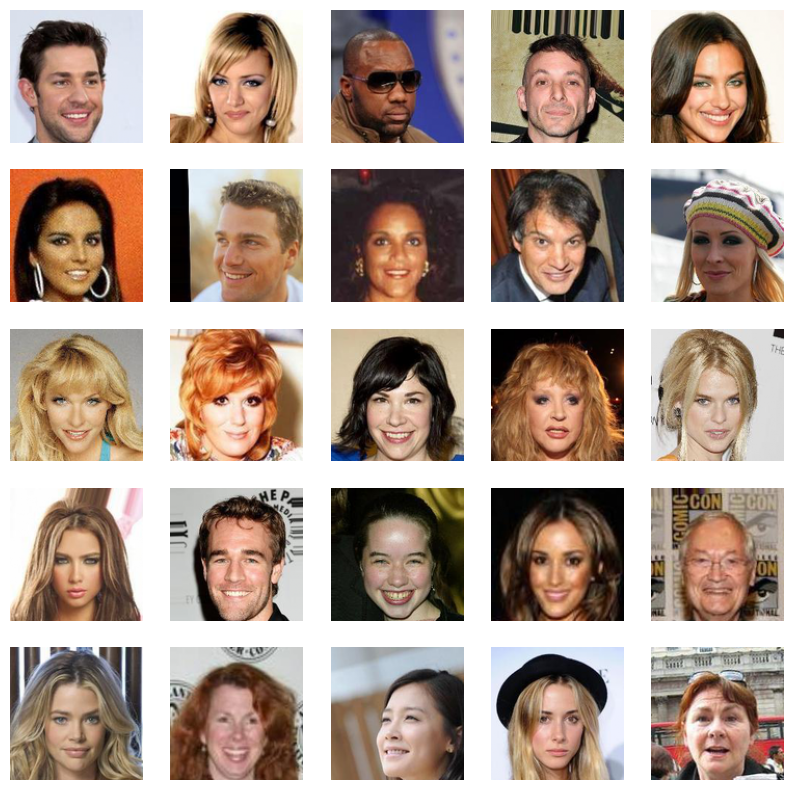

In [28]:
plt.figure(1, figsize=(10, 10))
for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(images[i])
    plt.axis('off')
plt.show()

In [29]:
LATENT_DIM = 32
CHANNELS = 3

def create_generator():
    gen_input = Input(shape=(LATENT_DIM, ))

    x = Dense(128 * 16 * 16)(gen_input)
    x = LeakyReLU()(x)
    x = Reshape((16, 16, 128))(x)

    x = Conv2D(256, 5, padding='same')(x)
    x = LeakyReLU()(x)

    x = Conv2DTranspose(256, 4, strides=2, padding='same')(x)
    x = LeakyReLU()(x)

    x = Conv2DTranspose(256, 4, strides=2, padding='same')(x)
    x = LeakyReLU()(x)

    x = Conv2DTranspose(256, 4, strides=2, padding='same')(x)
    x = LeakyReLU()(x)

    x = Conv2D(512, 5, padding='same')(x)
    x = LeakyReLU()(x)
    x = Conv2D(512, 5, padding='same')(x)
    x = LeakyReLU()(x)
    x = Conv2D(CHANNELS, 7, activation='tanh', padding='same')(x)

    generator = Model(gen_input, x)
    return generator

In [30]:
def create_discriminator():
    disc_input = Input(shape=(HEIGHT, WIDTH, CHANNELS))

    x = Conv2D(256, 3)(disc_input)
    x = LeakyReLU()(x)

    x = Conv2D(256, 4, strides=2)(x)
    x = LeakyReLU()(x)

    x = Conv2D(256, 4, strides=2)(x)
    x = LeakyReLU()(x)

    x = Conv2D(256, 4, strides=2)(x)
    x = LeakyReLU()(x)

    x = Conv2D(256, 4, strides=2)(x)
    x = LeakyReLU()(x)

    # flatten the output
    x = Flatten()(x)
    x = Dropout(0.4)(x)

    x = Dense(1, activation='sigmoid')(x)
    discriminator = Model(disc_input, x)

    # optimization function
    optimizer = RMSprop(
        lr=.0001,
        clipvalue=1.0,
        decay=1e-8
    )

    # compile the model
    discriminator.compile(
        optimizer=optimizer,
        loss='binary_crossentropy'
    )

    return discriminator

In [31]:
from IPython.display import Image
from keras.utils.vis_utils import model_to_dot

In [32]:
generator = create_generator()
generator.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32)]              0         
                                                                 
 dense (Dense)               (None, 32768)             1081344   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32768)             0         
                                                                 
 reshape (Reshape)           (None, 16, 16, 128)       0         
                                                                 
 conv2d (Conv2D)             (None, 16, 16, 256)       819456    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 16, 16, 256)       0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 32, 32, 256)      104883

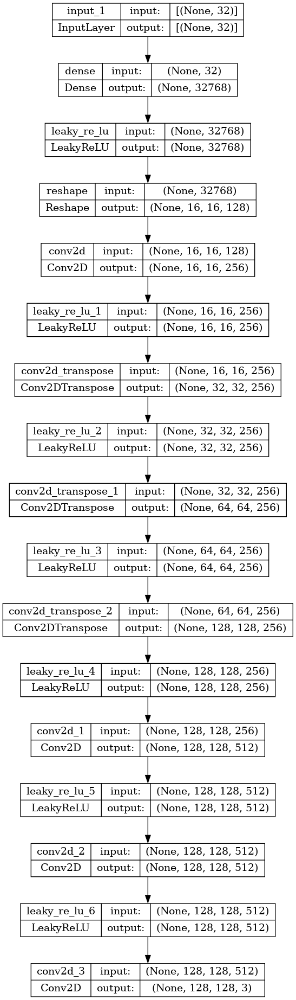

In [33]:
Image(model_to_dot(generator, show_shapes=True).create_png())

In [34]:
discriminator = create_discriminator()
discriminator.trainable = False
discriminator.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 128, 128, 3)]     0         
                                                                 
 conv2d_4 (Conv2D)           (None, 126, 126, 256)     7168      
                                                                 
 leaky_re_lu_7 (LeakyReLU)   (None, 126, 126, 256)     0         
                                                                 
 conv2d_5 (Conv2D)           (None, 62, 62, 256)       1048832   
                                                                 
 leaky_re_lu_8 (LeakyReLU)   (None, 62, 62, 256)       0         
                                                                 
 conv2d_6 (Conv2D)           (None, 30, 30, 256)       1048832   
                                                                 
 leaky_re_lu_9 (LeakyReLU)   (None, 30, 30, 256)       0   

/opt/conda/lib/python3.7/site-packages/keras/optimizers/optimizer_v2/rmsprop.py:143: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


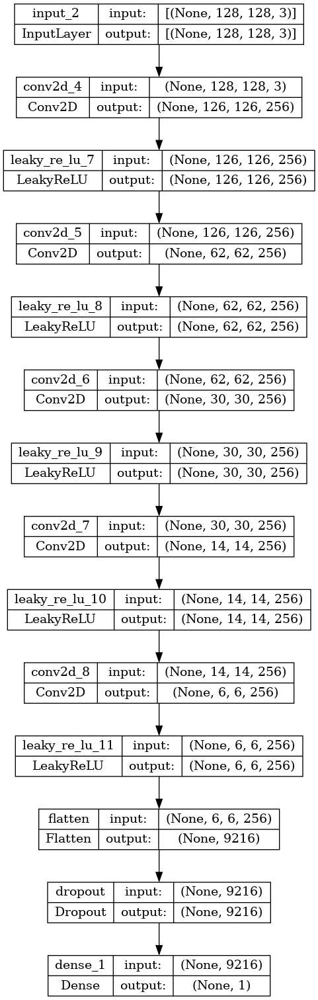

In [35]:
Image(model_to_dot(discriminator, show_shapes=True).create_png())

In [36]:
gan_input = Input(shape=(LATENT_DIM, ))
gan_output = discriminator(generator(gan_input))
gan = Model(gan_input, gan_output)

In [37]:
optimizer = RMSprop(lr=.0001, clipvalue=1.0, decay=1e-8)
gan.compile(optimizer=optimizer, loss='binary_crossentropy')

/opt/conda/lib/python3.7/site-packages/keras/optimizers/optimizer_v2/rmsprop.py:143: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [38]:
gan.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 32)]              0         
                                                                 
 model (Functional)          (None, 128, 128, 3)       14953987  
                                                                 
 model_1 (Functional)        (None, 1)                 4211713   
                                                                 
Total params: 19,165,700
Trainable params: 14,953,987
Non-trainable params: 4,211,713
_________________________________________________________________


In [39]:
import time
iters = 1500
batch_size = 16

# specify file path to store generated images
RES_DIR = 'res2'
FILE_PATH = '%s/generated_%d.png'
if not os.path.isdir(RES_DIR):
    os.mkdir(RES_DIR)

CONTROL_SIZE_SQRT = 6
control_vectors = np.random.normal(size=(CONTROL_SIZE_SQRT**2, LATENT_DIM)) / 2

start = 0
d_losses = []
a_losses = []
images_saved = 0

for step in range(iters):
    start_time = time.time()
    
    # use random noise vectors to generate image data
    latent_vectors = np.random.normal(size=(batch_size, LATENT_DIM))
    generated = generator.predict(latent_vectors)

    real = images[start:start + batch_size]
    combined_images = np.concatenate([generated, real])
    
    labels = np.concatenate([np.ones((batch_size, 1)), np.zeros((batch_size, 1))])
    labels += .05 * np.random.random(labels.shape)
    
    # calculate discriminant loss and append to list of loss values
    d_loss = discriminator.train_on_batch(combined_images, labels)
    d_losses.append(d_loss)

    latent_vectors = np.random.normal(size=(batch_size, LATENT_DIM))
    misleading_targets = np.zeros((batch_size, 1))
    
    # calculate adversary loss and append to list of loss values
    a_loss = gan.train_on_batch(latent_vectors, misleading_targets)
    a_losses.append(a_loss)

    start += batch_size
    if start > images.shape[0] - batch_size:
        start = 0
    
    # after every 50 iterations, save 'real classified' images and weights
    if step % 50 == 49:
        # save weights from training in dot file
        gan.save_weights('gan.h5')
        
        # print training progress 
        print('%d/%d: d_loss: %.4f,  a_loss: %.4f.  (%.1f sec)' % (step + 1, iters, d_loss, a_loss, time.time() - start_time))

        control_image = np.zeros((WIDTH * CONTROL_SIZE_SQRT, HEIGHT * CONTROL_SIZE_SQRT, CHANNELS))
        control_generated = generator.predict(control_vectors)
        
        # format images in 6x6 grid for final output
        for i in range(CONTROL_SIZE_SQRT ** 2):
            x_off = i % CONTROL_SIZE_SQRT
            y_off = i // CONTROL_SIZE_SQRT
            control_image[x_off * WIDTH:(x_off + 1) * WIDTH, y_off * HEIGHT:(y_off + 1) * HEIGHT, :] = control_generated[i, :, :, :]
        
        # save generated images in folder    
        im = Img.fromarray(np.uint8(control_image * 255))#.save(StringIO(), 'jpeg')
        im.save(FILE_PATH % (RES_DIR, images_saved))
        images_saved += 1

1/1 [==============================] - 0s 20ms/step
50/1500: d_loss: 0.5843,  a_loss: 0.7398.  (1.2 sec)
1/1 [==============================] - 0s 21ms/step
100/1500: d_loss: 0.6052,  a_loss: 0.7879.  (1.1 sec)
1/1 [==============================] - 0s 23ms/step
150/1500: d_loss: 0.5926,  a_loss: 0.7717.  (1.4 sec)
1/1 [==============================] - 0s 21ms/step
200/1500: d_loss: 0.6429,  a_loss: 0.9629.  (1.2 sec)
1/1 [==============================] - 0s 21ms/step
250/1500: d_loss: 0.6528,  a_loss: 1.3585.  (1.1 sec)
1/1 [==============================] - 0s 21ms/step
300/1500: d_loss: 0.6464,  a_loss: 0.9112.  (1.1 sec)
1/1 [==============================] - 0s 22ms/step
350/1500: d_loss: 0.6740,  a_loss: 1.0433.  (1.4 sec)
1/1 [==============================] - 0s 21ms/step
400/1500: d_loss: 0.6732,  a_loss: 0.9501.  (1.2 sec)
1/1 [==============================] - 0s 22ms/step
450/1500: d_loss: 0.6704,  a_loss: 0.8609.  (1.1 sec)
1/1 [==============================] - 0s 19ms/

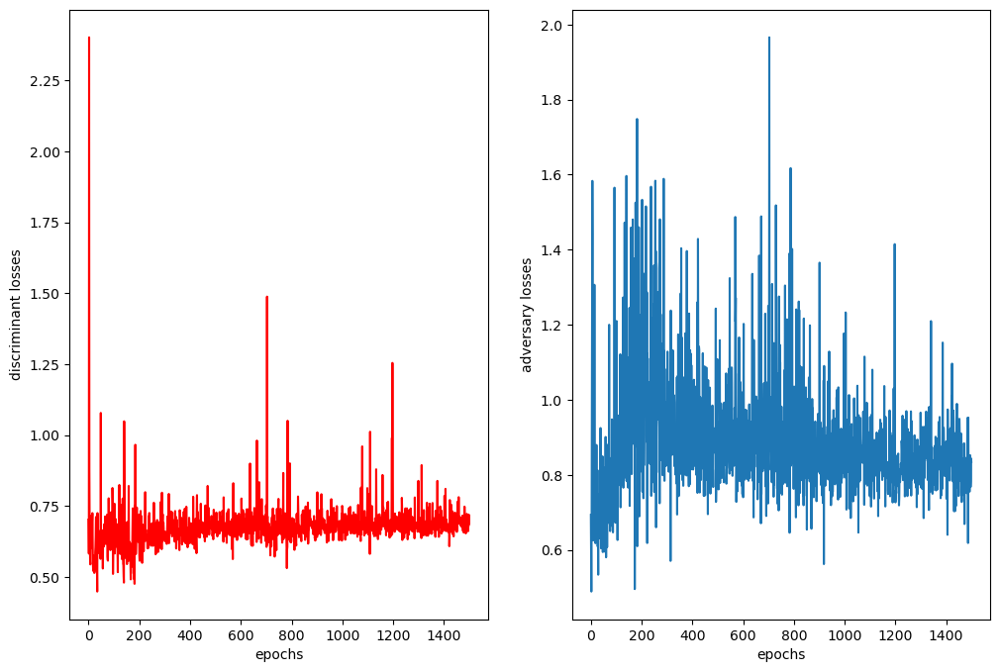

In [40]:
plt.figure(1, figsize=(12, 8))
plt.subplot(121)
plt.plot(d_losses, color='red')
plt.xlabel('epochs')
plt.ylabel('discriminant losses')
plt.subplot(122)
plt.plot(a_losses)
plt.xlabel('epochs')
plt.ylabel('adversary losses')
plt.show()

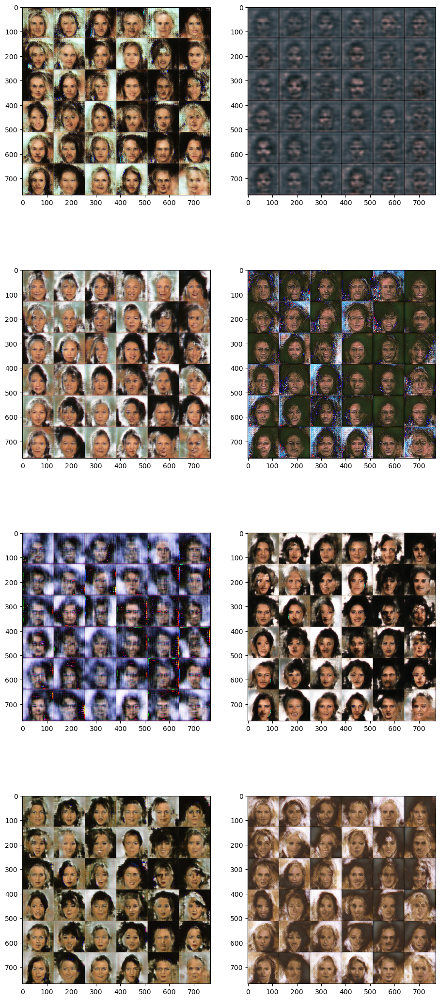

In [44]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams

%matplotlib inline

rcParams['figure.figsize'] = 11,27

# read images
img_A = mpimg.imread('/kaggle/working/res2/generated_15.png')
img_B = mpimg.imread('/kaggle/working/res2/generated_1.png')
img_C = mpimg.imread('/kaggle/working/res2/generated_18.png')
img_D = mpimg.imread('/kaggle/working/res2/generated_10.png')
img_E = mpimg.imread('/kaggle/working/res2/generated_5.png')
img_F = mpimg.imread('/kaggle/working/res2/generated_26.png')
img_G = mpimg.imread('/kaggle/working/res2/generated_22.png')
img_H = mpimg.imread('/kaggle/working/res2/generated_13.png')

# display images
fig, ax = plt.subplots(4,2)
ax[0,0].imshow(img_A);
ax[0,1].imshow(img_B);
ax[1,0].imshow(img_C);
ax[1,1].imshow(img_D);
ax[2,0].imshow(img_E);
ax[2,1].imshow(img_F);
ax[3,0].imshow(img_G);
ax[3,1].imshow(img_H);

In [45]:
import imageio
import shutil 
images_to_gif = []
for filename in os.listdir(RES_DIR):
    images_to_gif.append(imageio.imread(RES_DIR + '/' + filename))
imageio.mimsave('training_visual.gif', images_to_gif)
shutil.rmtree(RES_DIR)

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  """
